In [26]:
import pandas as pd
import numpy as np
import plotly.express as px
from scipy.stats import ttest_ind, chi2_contingency,pearsonr

csv_url1 = "/content/drive/MyDrive/Colab Notebooks/ADAH_Project/Train_sexAge.csv"
csv_url2 = "/content/drive/MyDrive/Colab Notebooks/ADAH_Project/Test_sexAge.csv"
df_Train = pd.read_csv(csv_url1)
df_Test = pd.read_csv(csv_url2)
github_repo_url1 = "/content/drive/MyDrive/Colab Notebooks/ADAH_Project/Train/"
github_repo_url2 = "/content/drive/MyDrive/Colab Notebooks/ADAH_Project/Test/"
df_Train['image_link'] = df_Train['ID'].apply(lambda x: f"{github_repo_url1}areg_{x}.nii")
df_Test['image_link'] = df_Test['MRI_ID'].apply(lambda x: f"{github_repo_url2}areg_{x}.nii")
print('Training Data')
print(df_Train.head())
print(df_Train.info())

Training Data
          ID target  Sex   Age   TIV  site  \
0  ADHD_1003   ADHD    0  12.8  1523     2   
1  ADHD_1005   ADHD    1  10.1  1598     2   
2  ADHD_1006   ADHD    1  16.2  1284     2   
3  ADHD_1008   ADHD    0  10.7  1750     2   
4  ADHD_1009   ADHD    0   9.2  1517     2   

                                          image_link  
0  /content/drive/MyDrive/Colab Notebooks/ADAH_Pr...  
1  /content/drive/MyDrive/Colab Notebooks/ADAH_Pr...  
2  /content/drive/MyDrive/Colab Notebooks/ADAH_Pr...  
3  /content/drive/MyDrive/Colab Notebooks/ADAH_Pr...  
4  /content/drive/MyDrive/Colab Notebooks/ADAH_Pr...  
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 395 entries, 0 to 394
Data columns (total 7 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   ID          395 non-null    object 
 1   target      395 non-null    object 
 2   Sex         395 non-null    int64  
 3   Age         395 non-null    float64
 4   TIV         395 non-null

In [25]:

print('Testing Data')
print(df_Test.head())
adhd_data = df_Train[df_Train['target'] == 'ADHD'].sort_values(by=['Sex', 'Age'])
hcon_data = df_Train[df_Train['target'] == 'hCon'].sort_values(by=['Sex', 'Age'])
adhd_test = df_Test[df_Test['group'] == 0].sort_values(by=['Sex', 'Age'])
hcon_test = df_Test[df_Test['group'] == 1].sort_values(by=['Sex', 'Age'])
fig_adhd = px.bar(adhd_data, x='ID', y='Age', color='Sex', title='ADHD Data',
                  hover_data=['Sex', 'Age', 'image_link'])
fig_hcon = px.bar(hcon_data, x='ID', y='Age', color='Sex', title='hCon Data',
                  hover_data=['Sex', 'Age', 'image_link'])
fig_adhd_test = px.bar(adhd_test, x='MRI_ID', y='Age', color='Sex', title='ADHD Test',
                  hover_data=['Sex', 'Age', 'image_link'])
fig_hcon_test = px.bar(hcon_test, x='MRI_ID', y='Age', color='Sex', title='hCon Test',
                  hover_data=['Sex', 'Age', 'image_link'])
fig_adhd.show()
fig_hcon.show()
fig_adhd_test.show()
fig_hcon_test.show()

Testing Data
     MRI_ID  group    Age  Sex  site  \
0  ADHD_002      0  15.00    0     4   
1  ADHD_003      0  14.90    0     4   
2  ADHD_004      0   9.11    1     4   
3  ADHD_005      0  14.00    0     4   
4  ADHD_006      0  10.20    0     4   

                                          image_link  
0  /content/drive/MyDrive/Colab Notebooks/ADAH_Pr...  
1  /content/drive/MyDrive/Colab Notebooks/ADAH_Pr...  
2  /content/drive/MyDrive/Colab Notebooks/ADAH_Pr...  
3  /content/drive/MyDrive/Colab Notebooks/ADAH_Pr...  
4  /content/drive/MyDrive/Colab Notebooks/ADAH_Pr...  


In [3]:
count_train_by_sex = df_Train[df_Train['target'].isin(['ADHD', 'hCon'])].groupby(['target', 'Sex']).size().reset_index(name='count')
count_test_by_sex = df_Test[df_Test['group'].isin([0, 1])].groupby(['group', 'Sex']).size().reset_index(name='count')
print('Sort training data by sex')
print(count_train_by_sex)
print('Sort testing data by sex')
print(count_test_by_sex)
print("ADHD_Train : ",adhd_data.describe())
print("hCon_Train : ",hcon_data.describe())
print("ADHD_Test : ",adhd_test.describe())
print("hCon_Test : ",hcon_test.describe())


Sort training data by sex
  target  Sex  count
0   ADHD    0    208
1   ADHD    1     58
2   hCon    0     66
3   hCon    1     63
Sort testing data by sex
   group  Sex  count
0      0    0     54
1      0    1      7
2      1    0     58
3      1    1     17
ADHD_Train :                Sex         Age          TIV        site
count  266.000000  266.000000   266.000000  266.000000
mean     0.218045   10.938722  1531.815789    1.849624
std      0.413697    3.063203   138.341579    0.638350
min      0.000000    6.000000  1148.000000    1.000000
25%      0.000000    8.400000  1446.000000    1.000000
50%      0.000000   10.600000  1525.000000    2.000000
75%      0.000000   12.900000  1620.000000    2.000000
max      1.000000   17.700000  2102.000000    3.000000
hCon_Train :                Sex         Age          TIV        site
count  129.000000  129.000000   129.000000  129.000000
mean     0.488372   10.803876  1523.395349    2.155039
std      0.501814    3.296267   146.750182    0.689

Visualization of areg_hCon_1121.nii (hCon group)


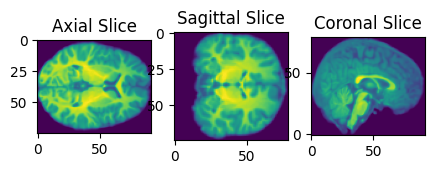

Visualization of areg_hCon_1126.nii (hCon group)


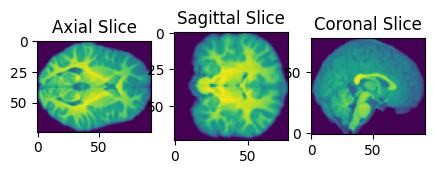

Visualization of areg_hCon_1128.nii (hCon group)


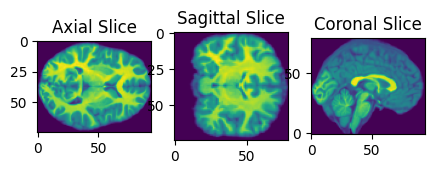

Visualization of areg_hCon_1140.nii (hCon group)


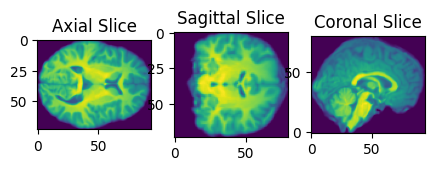

Visualization of areg_hCon_1129.nii (hCon group)


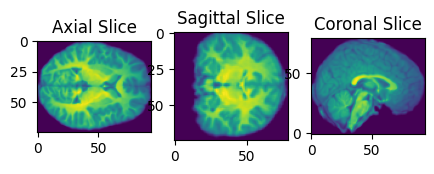

Visualization of areg_hCon_1134.nii (hCon group)


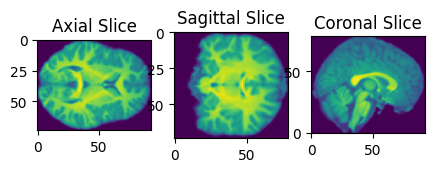

Visualization of areg_hCon_1136.nii (hCon group)


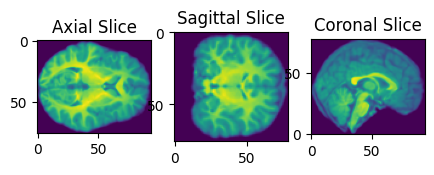

Visualization of areg_hCon_1138.nii (hCon group)


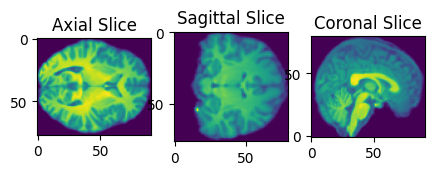

Visualization of areg_hCon_1137.nii (hCon group)


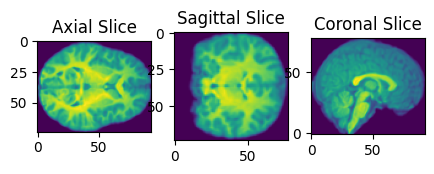

Visualization of areg_hCon_1123.nii (hCon group)


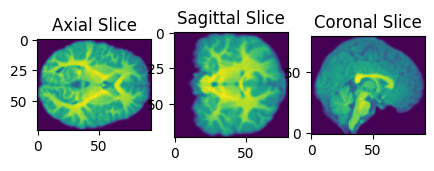

Visualization of areg_hCon_1124.nii (hCon group)


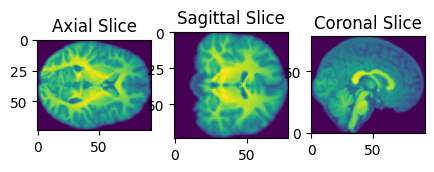

Visualization of areg_hCon_1122.nii (hCon group)


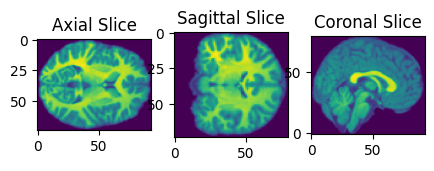

Visualization of areg_hCon_1101.nii (hCon group)


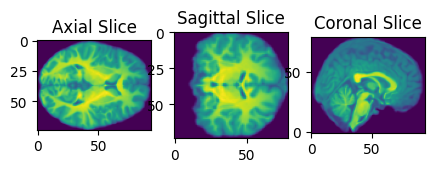

Visualization of areg_hCon_1131.nii (hCon group)


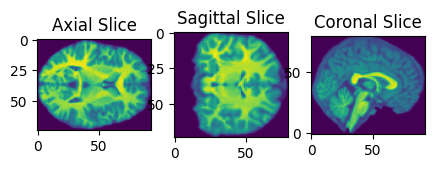

Visualization of areg_hCon_1106.nii (hCon group)


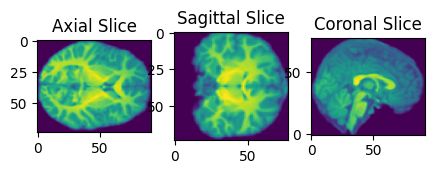

Visualization of areg_hCon_1109.nii (hCon group)


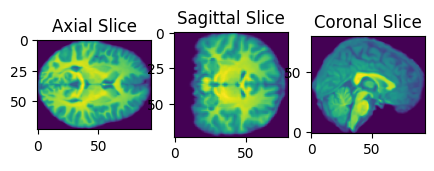

Visualization of areg_hCon_1102.nii (hCon group)


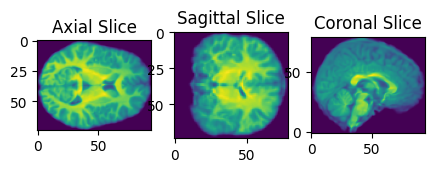

Visualization of areg_hCon_1114.nii (hCon group)


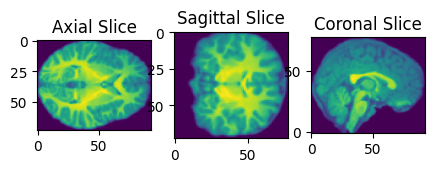

Visualization of areg_hCon_1111.nii (hCon group)


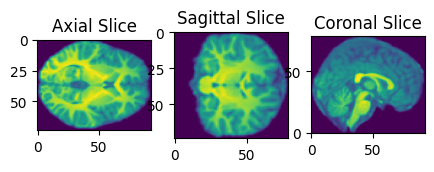

Visualization of areg_hCon_1125.nii (hCon group)


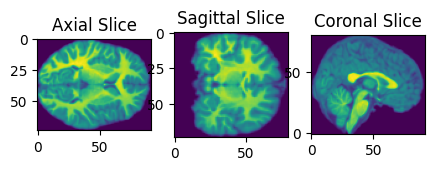

Visualization of areg_hCon_1100.nii (hCon group)


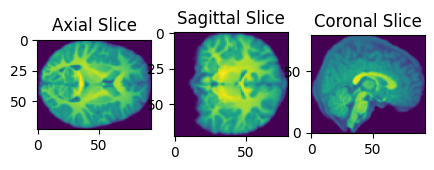

Visualization of areg_hCon_1135.nii (hCon group)


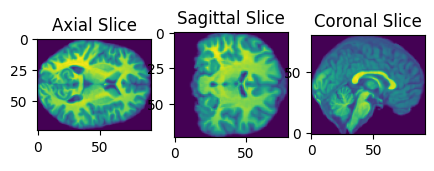

Visualization of areg_hCon_1118.nii (hCon group)


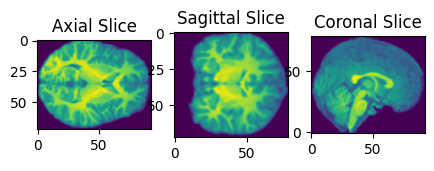

Visualization of areg_hCon_1119.nii (hCon group)


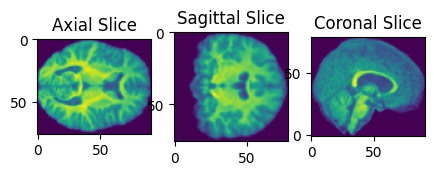

Visualization of areg_hCon_1127.nii (hCon group)


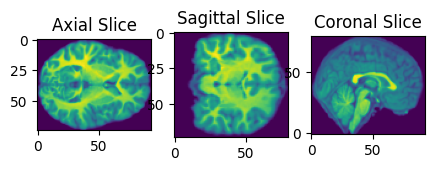

Visualization of areg_hCon_1133.nii (hCon group)


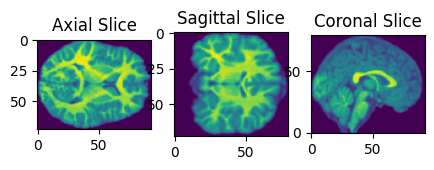

Visualization of areg_hCon_1132.nii (hCon group)


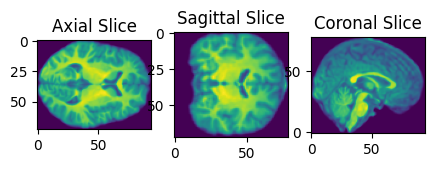

Visualization of areg_hCon_1130.nii (hCon group)


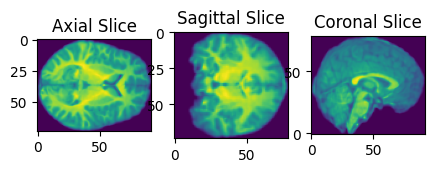

Visualization of areg_hCon_1105.nii (hCon group)


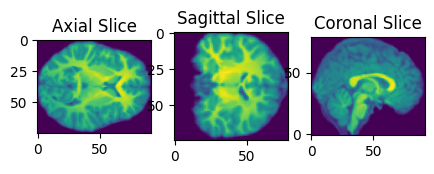

Visualization of areg_hCon_1139.nii (hCon group)


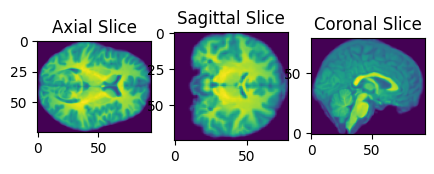

Visualization of areg_hCon_1108.nii (hCon group)


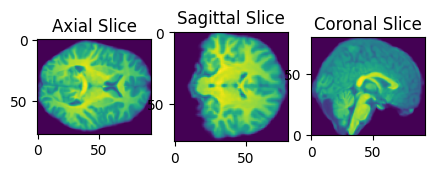

Visualization of areg_hCon_1104.nii (hCon group)


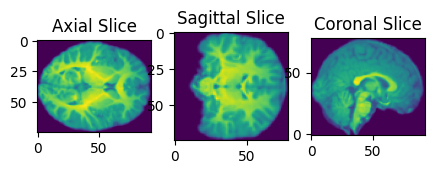

Visualization of areg_hCon_1094.nii (hCon group)


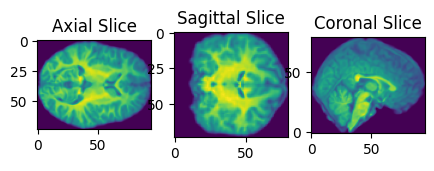

Visualization of areg_hCon_1092.nii (hCon group)


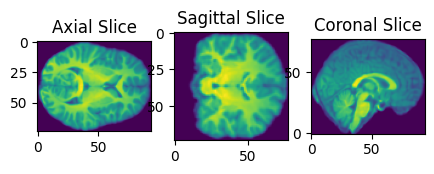

Visualization of areg_hCon_1117.nii (hCon group)


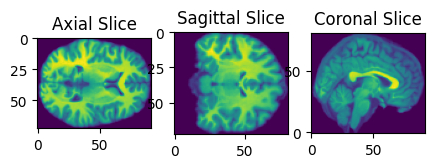

Visualization of areg_hCon_1085.nii (hCon group)


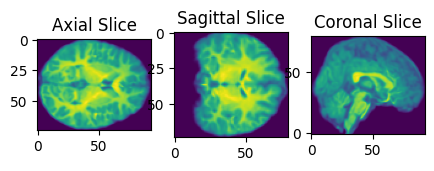

Visualization of areg_hCon_1107.nii (hCon group)


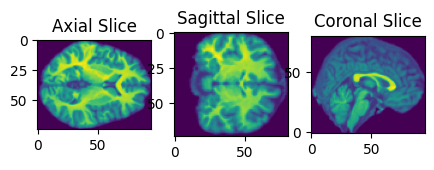

Visualization of areg_hCon_1099.nii (hCon group)


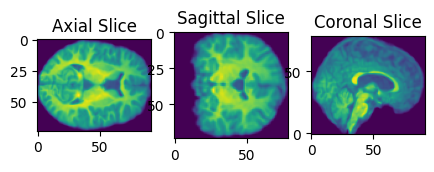

Visualization of areg_hCon_1116.nii (hCon group)


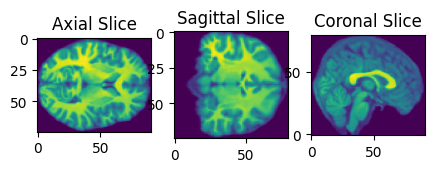

Visualization of areg_hCon_1090.nii (hCon group)


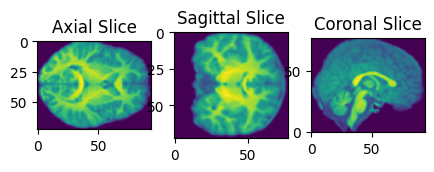

Visualization of areg_hCon_1097.nii (hCon group)


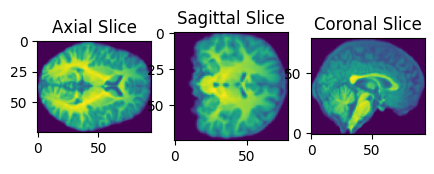

Visualization of areg_hCon_1081.nii (hCon group)


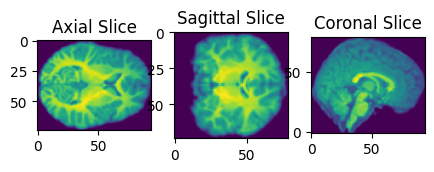

Visualization of areg_hCon_1091.nii (hCon group)


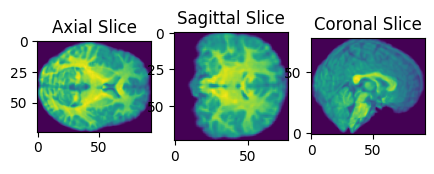

Visualization of areg_hCon_1093.nii (hCon group)


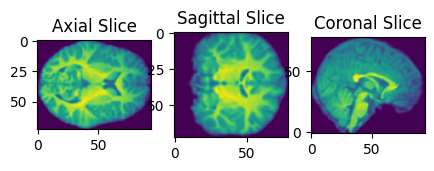

Visualization of areg_hCon_1084.nii (hCon group)


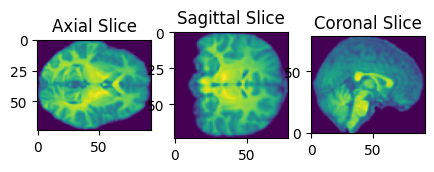

Visualization of areg_hCon_1112.nii (hCon group)


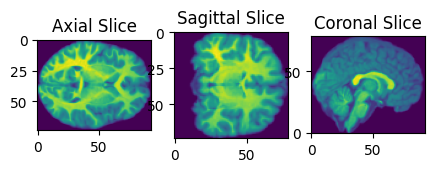

Visualization of areg_hCon_1115.nii (hCon group)


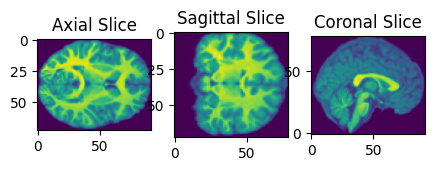

Visualization of areg_hCon_1098.nii (hCon group)


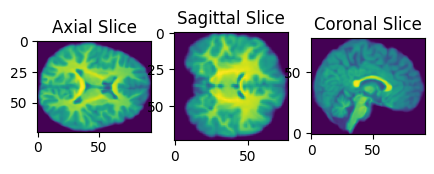

Visualization of areg_hCon_1110.nii (hCon group)


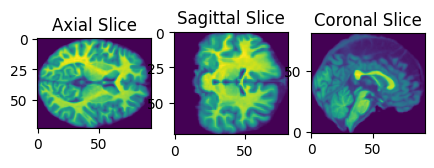

Visualization of areg_hCon_1113.nii (hCon group)


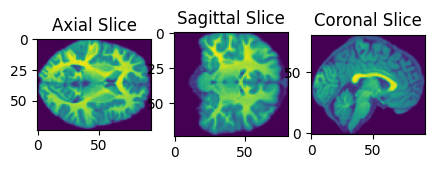

Visualization of areg_hCon_1095.nii (hCon group)


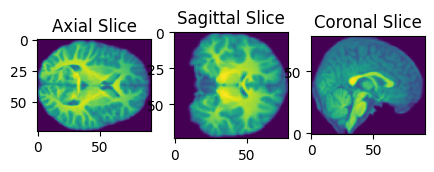

Visualization of areg_hCon_1120.nii (hCon group)


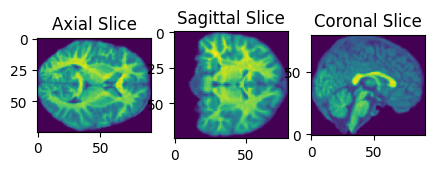

Visualization of areg_hCon_1088.nii (hCon group)


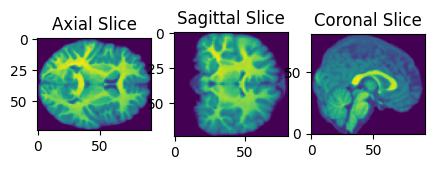

Visualization of areg_hCon_1086.nii (hCon group)


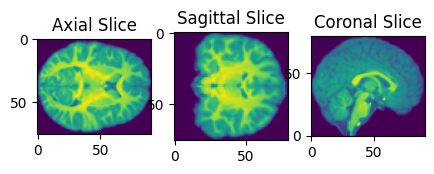

Visualization of areg_hCon_1079.nii (hCon group)


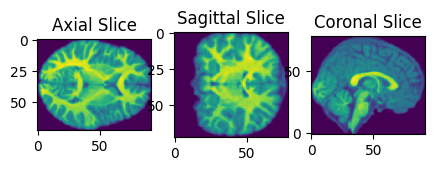

Visualization of areg_hCon_1096.nii (hCon group)


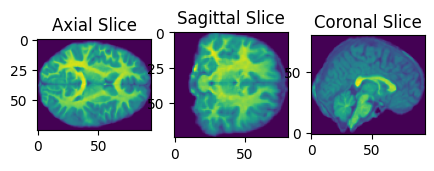

Visualization of areg_hCon_1083.nii (hCon group)


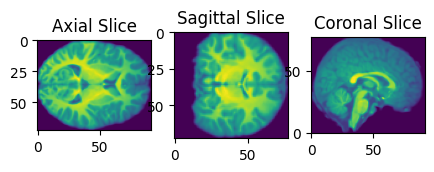

Visualization of areg_hCon_1082.nii (hCon group)


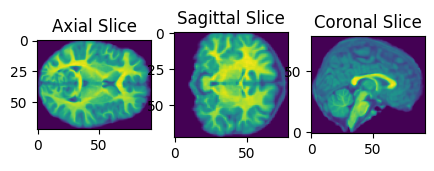

Visualization of areg_hCon_1103.nii (hCon group)


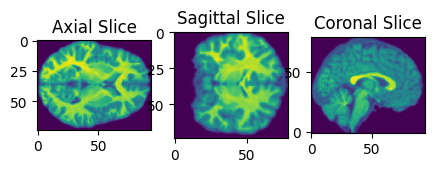

Visualization of areg_hCon_1089.nii (hCon group)


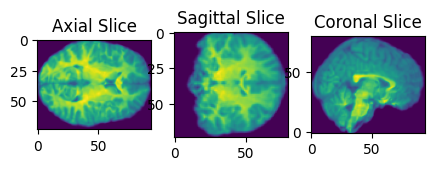

Visualization of areg_hCon_1087.nii (hCon group)


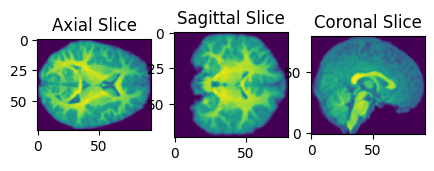

Visualization of areg_hCon_1080.nii (hCon group)


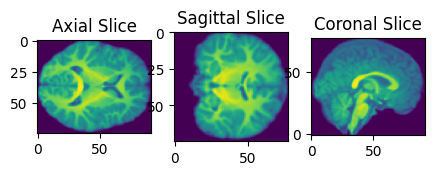

Visualization of areg_hCon_1058.nii (hCon group)


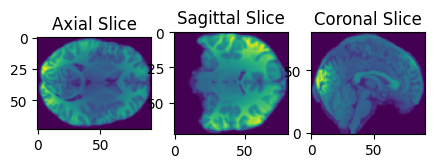

Visualization of areg_hCon_1046.nii (hCon group)


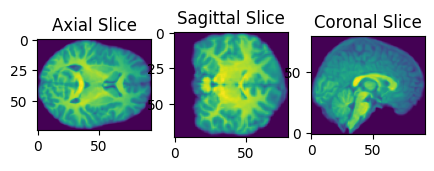

Visualization of areg_hCon_1070.nii (hCon group)


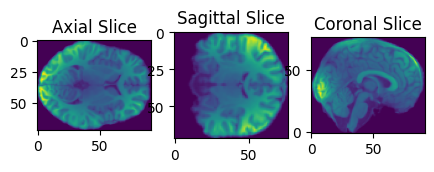

Visualization of areg_hCon_1072.nii (hCon group)


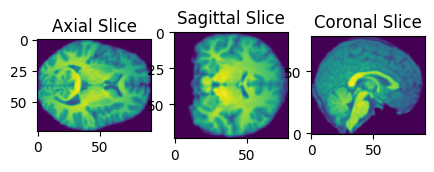

Visualization of areg_hCon_1028.nii (hCon group)


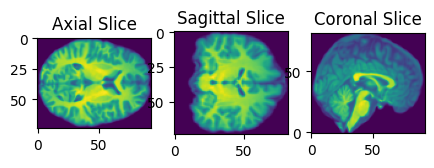

Visualization of areg_hCon_1029.nii (hCon group)


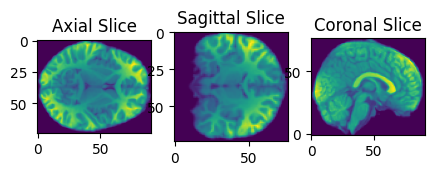

Visualization of areg_hCon_1048.nii (hCon group)


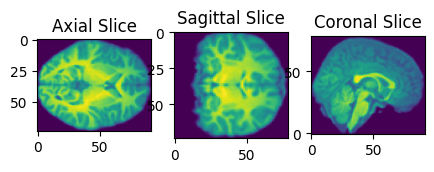

Visualization of areg_hCon_1076.nii (hCon group)


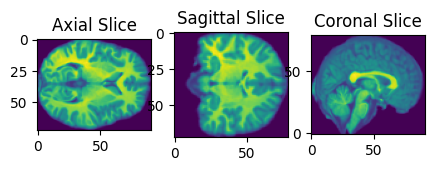

Visualization of areg_hCon_1063.nii (hCon group)


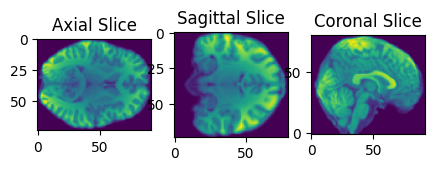

Visualization of areg_hCon_1061.nii (hCon group)


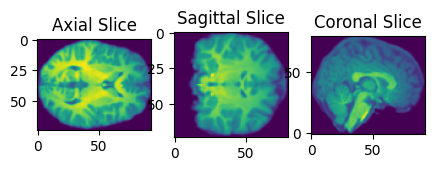

Visualization of areg_hCon_1059.nii (hCon group)


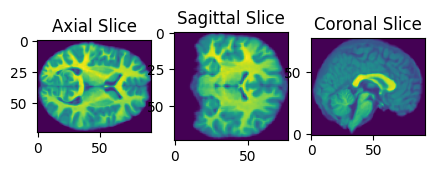

Visualization of areg_hCon_1073.nii (hCon group)


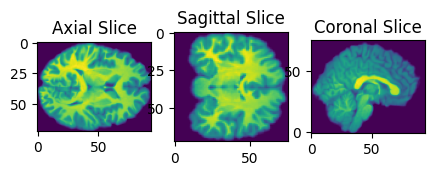

Visualization of areg_hCon_1074.nii (hCon group)


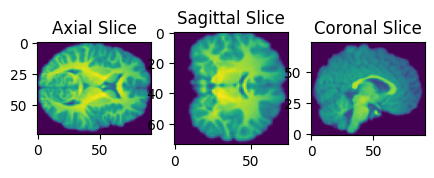

Visualization of areg_hCon_1069.nii (hCon group)


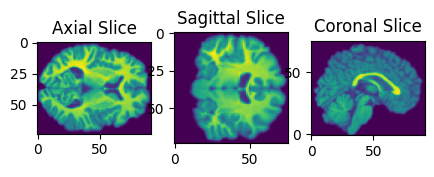

Visualization of areg_hCon_1057.nii (hCon group)


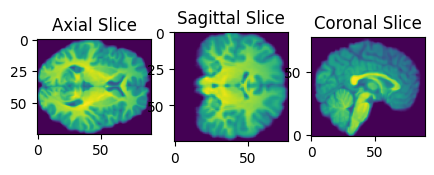

Visualization of areg_hCon_1075.nii (hCon group)


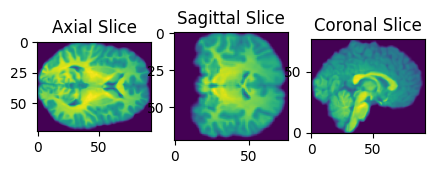

Visualization of areg_hCon_1068.nii (hCon group)


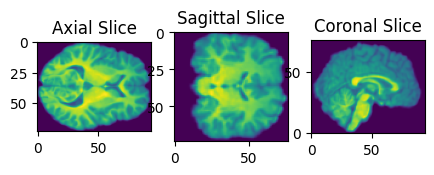

Visualization of areg_hCon_1077.nii (hCon group)


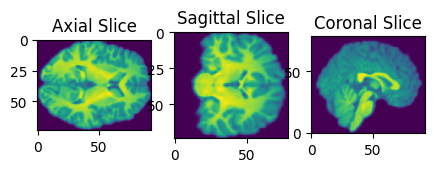

Visualization of areg_hCon_1078.nii (hCon group)


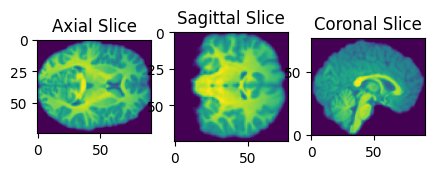

Visualization of areg_hCon_1044.nii (hCon group)


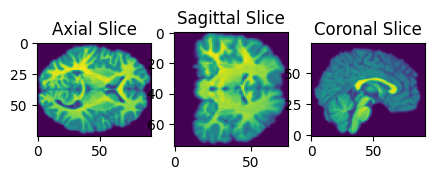

Visualization of areg_hCon_1071.nii (hCon group)


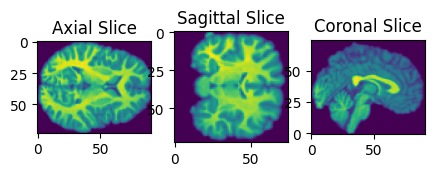

Visualization of areg_hCon_1064.nii (hCon group)


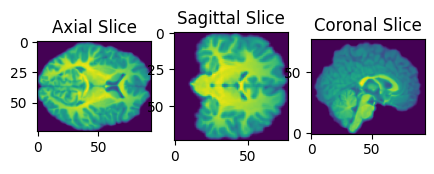

Visualization of areg_hCon_1052.nii (hCon group)


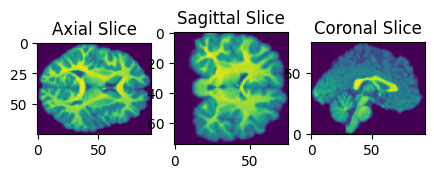

Visualization of areg_hCon_1053.nii (hCon group)


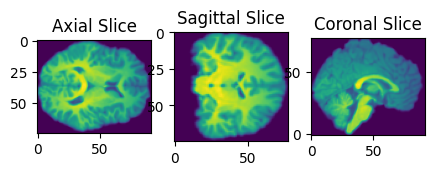

Visualization of areg_hCon_1020.nii (hCon group)


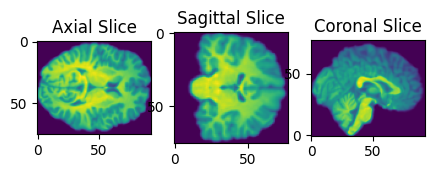

Visualization of areg_hCon_1036.nii (hCon group)


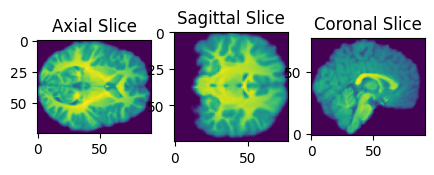

Visualization of areg_hCon_1065.nii (hCon group)


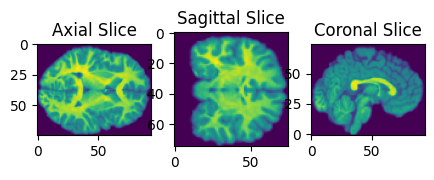

Visualization of areg_hCon_1041.nii (hCon group)


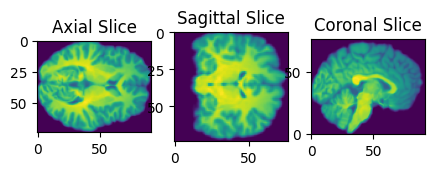

Visualization of areg_hCon_1042.nii (hCon group)


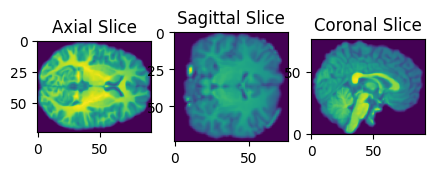

Visualization of areg_hCon_1060.nii (hCon group)


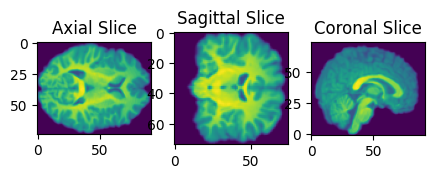

Visualization of areg_hCon_1066.nii (hCon group)


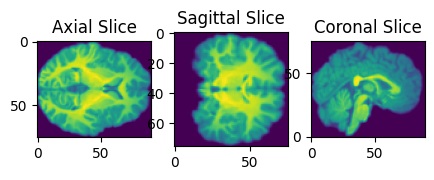

Visualization of areg_hCon_1030.nii (hCon group)


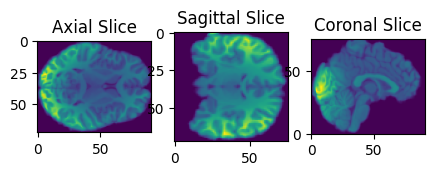

Visualization of areg_hCon_1055.nii (hCon group)


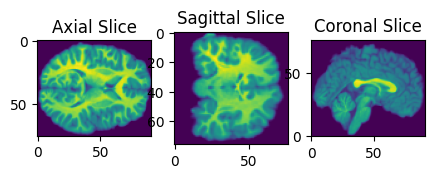

Visualization of areg_hCon_1056.nii (hCon group)


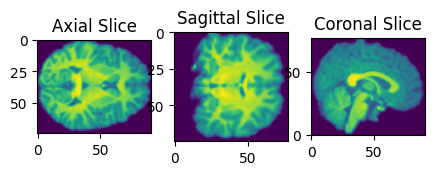

Visualization of areg_hCon_1050.nii (hCon group)


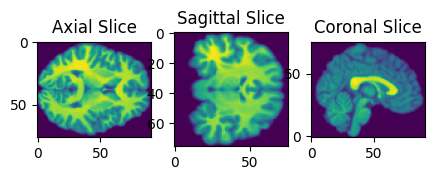

Visualization of areg_hCon_1021.nii (hCon group)


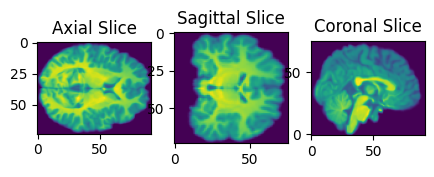

Visualization of areg_hCon_1062.nii (hCon group)


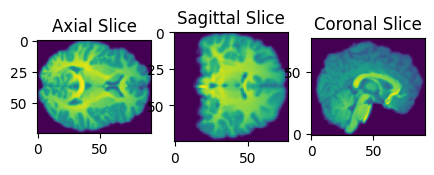

Visualization of areg_hCon_1043.nii (hCon group)


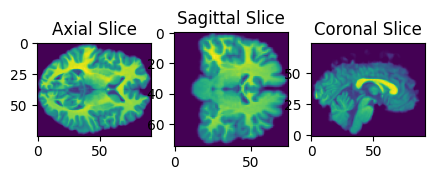

Visualization of areg_hCon_1047.nii (hCon group)


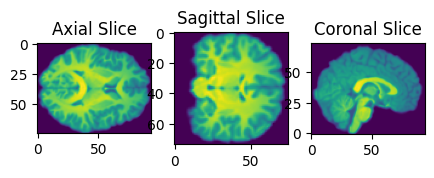

Visualization of areg_hCon_1013.nii (hCon group)


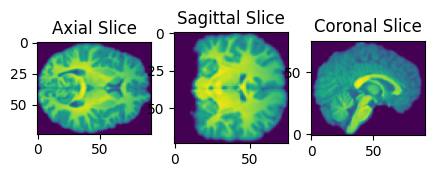

Visualization of areg_hCon_1037.nii (hCon group)


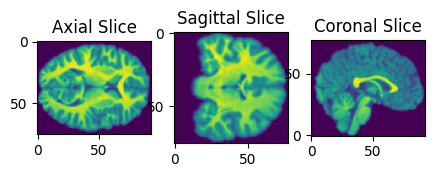

Visualization of areg_hCon_1038.nii (hCon group)


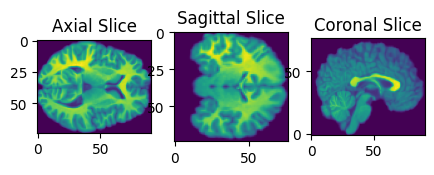

Visualization of areg_hCon_1010.nii (hCon group)


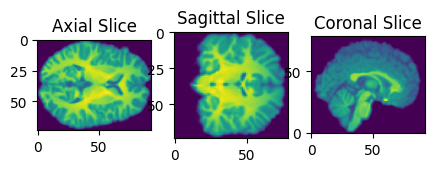

Visualization of areg_hCon_1017.nii (hCon group)


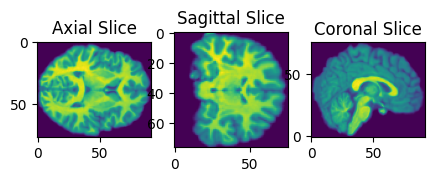

Visualization of areg_hCon_1019.nii (hCon group)


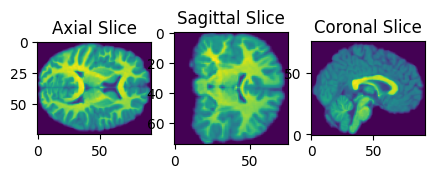

Visualization of areg_hCon_1022.nii (hCon group)


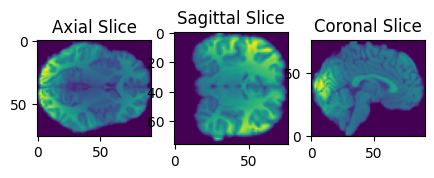

Visualization of areg_hCon_1023.nii (hCon group)


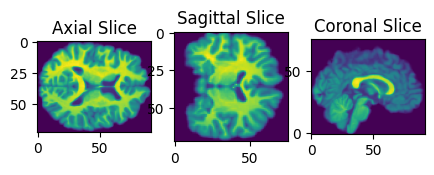

Visualization of areg_hCon_1009.nii (hCon group)


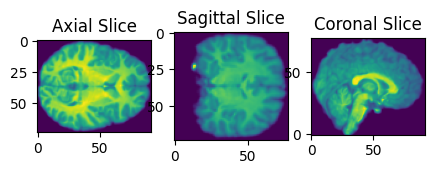

Visualization of areg_hCon_1035.nii (hCon group)


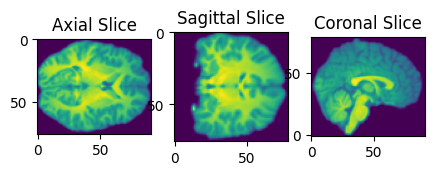

Visualization of areg_hCon_1031.nii (hCon group)


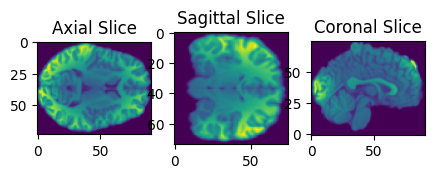

Visualization of areg_hCon_1039.nii (hCon group)


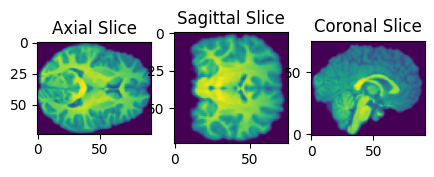

Visualization of areg_hCon_1032.nii (hCon group)


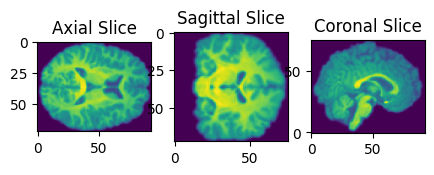

Visualization of areg_hCon_1025.nii (hCon group)


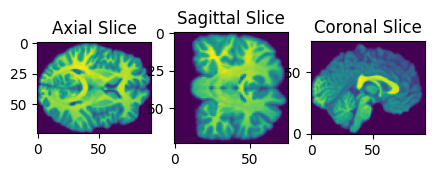

Visualization of areg_hCon_1008.nii (hCon group)


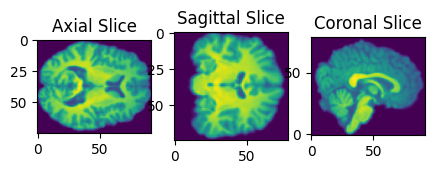

Visualization of areg_hCon_1005.nii (hCon group)


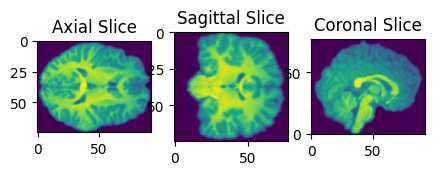

Visualization of areg_hCon_1040.nii (hCon group)


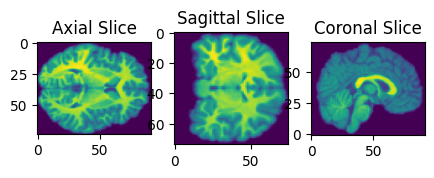

Visualization of areg_hCon_1011.nii (hCon group)


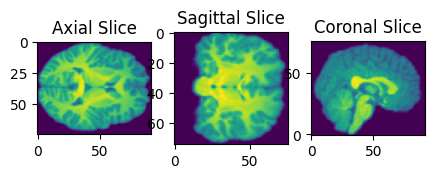

Visualization of areg_hCon_1027.nii (hCon group)


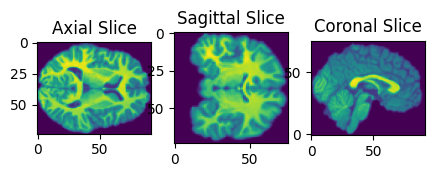

Visualization of areg_hCon_1004.nii (hCon group)


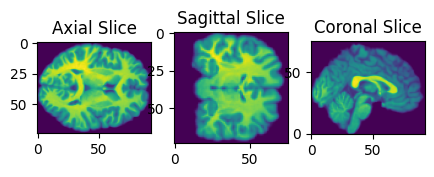

Visualization of areg_hCon_1014.nii (hCon group)


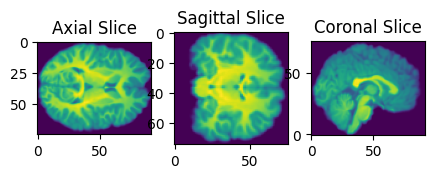

Visualization of areg_hCon_1002.nii (hCon group)


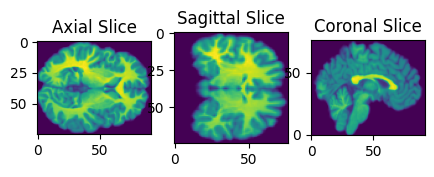

Visualization of areg_hCon_1003.nii (hCon group)


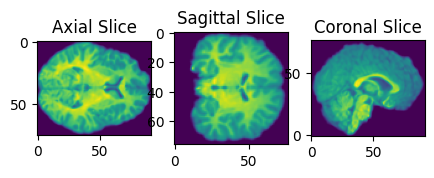

Visualization of areg_hCon_1007.nii (hCon group)


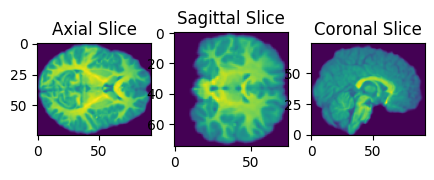

Visualization of areg_hCon_1006.nii (hCon group)


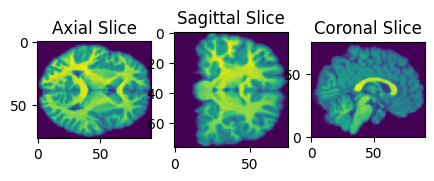

Visualization of areg_hCon_1018.nii (hCon group)


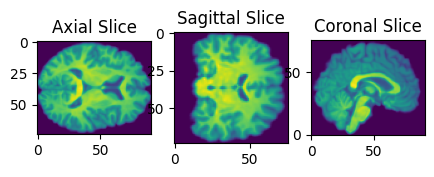

Visualization of areg_hCon_1016.nii (hCon group)


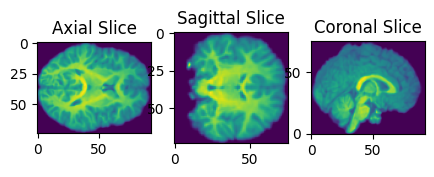

Visualization of areg_hCon_1012.nii (hCon group)


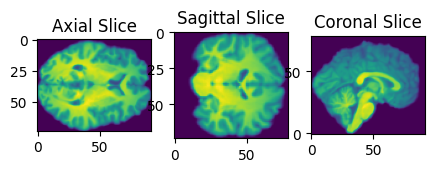

In [34]:
import os
import re
import nibabel as nib
import matplotlib.pyplot as plt
import numpy as np


data_directory = "/content/drive/MyDrive/Colab Notebooks/ADAH_Project/Train/"
pattern_adhd = re.compile(r'ADHD')
pattern_hcon = re.compile(r'hCon')
adhd_group = []
hcon_group = []

nifti_files = [file for file in os.listdir(data_directory) if file.endswith('.nii')]

for nifti_file in nifti_files:
    file_path = os.path.join(data_directory, nifti_file)

    nifti_img = nib.load(file_path)

    header = nifti_img.header
    dimensions = header.get_data_shape()

    if pattern_adhd.search(nifti_file):
        adhd_group.append((nifti_file, nifti_img))
    elif pattern_hcon.search(nifti_file):
        hcon_group.append((nifti_file, nifti_img))


def delete_black_areas(img_data):

    threshold = np.mean(img_data) / 3


    binary_mask = img_data > threshold


    non_zero_indices = np.nonzero(binary_mask)
    bounding_box = np.min(non_zero_indices[0]), np.max(non_zero_indices[0]), \
                   np.min(non_zero_indices[1]), np.max(non_zero_indices[1]), \
                   np.min(non_zero_indices[2]), np.max(non_zero_indices[2])


    cropped_img = img_data[bounding_box[0]:bounding_box[1] + 1,
                           bounding_box[2]:bounding_box[3] + 1,
                           bounding_box[4]:bounding_box[5] + 1]

    return cropped_img


for file_name, nifti_img in hcon_group:
    print(f"Visualization of {file_name} (hCon group)")
    img_data = nifti_img.get_fdata()


    cropped_img = delete_black_areas(img_data)

    fig, axes = plt.subplots(1, 3, figsize=(5, 5))

    axes[0].imshow(cropped_img[:, :, cropped_img.shape[2] // 2])
    axes[0].set_title('Axial Slice')

    axes[1].imshow(cropped_img[:, cropped_img.shape[1] // 2, :])
    axes[1].set_title('Sagittal Slice')

    axes[2].imshow(cropped_img[cropped_img.shape[0] // 2, :, :].T, origin='lower')
    axes[2].set_title('Coronal Slice')

    plt.show()


In [33]:
for file_name, nifti_img in adhd_group:
    print(f"Visualization of {file_name} (ADHD group)")
    img_data = nifti_img.get_fdata()


    cropped_img = delete_black_areas(img_data)

    fig, axes = plt.subplots(1, 3, figsize=(5, 5))

    axes[0].imshow(cropped_img[:, :, cropped_img.shape[2] // 2])
    axes[0].set_title('Axial Slice')

    axes[1].imshow(cropped_img[:, cropped_img.shape[1] // 2, :])
    axes[1].set_title('Sagittal Slice')

    axes[2].imshow(cropped_img[cropped_img.shape[0] // 2, :, :].T, origin='lower')
    axes[2].set_title('Coronal Slice')

    plt.show()


Output hidden; open in https://colab.research.google.com to view.